<a href="https://colab.research.google.com/github/OmriGruman/object-detection/blob/master/yolov3_night_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

Clone repo, install dependencies and check PyTorch and GPU.

In [1]:
!git clone https://github.com/ultralytics/yolov3  # clone
%cd yolov3
%pip install -qr requirements.txt  # install

import torch
from yolov3 import utils
display = utils.notebook_init()  # checks

YOLOv3 🚀 v9.6.0-46-gca9a981 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)


Setup complete ✅ (12 CPUs, 83.5 GB RAM, 25.9/166.8 GB disk)


Some important parameters throughout the project

CURRENCY = https://universe.roboflow.com/ds/kCykUm7ZFj?key=Tt6fZrPf98

In [2]:
PROJECT_NAME = "night-vision" 

DATASET_LINK = "https://universe.roboflow.com/ds/fFD23lrfYI?key=fI8muF3S9O"

VIDEO_LINK = "https://www.youtube.com/watch?v=POtelN1FeZ4"

#Data

Download dataset

In [3]:
%cd /content

!mkdir datasets
!curl -L {DATASET_LINK} > roboflow.zip
!unzip -q roboflow.zip -d /content/datasets/{PROJECT_NAME}
!rm roboflow.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   887  100   887    0     0   4125      0 --:--:-- --:--:-- --:--:--  4106
100  612M  100  612M    0     0   119M      0  0:00:05  0:00:05 --:--:--  133M


Read classes

In [4]:
%cd /content/datasets/{PROJECT_NAME}/test

with open("_darknet.labels", 'r') as f:
    class_names = f.read().split('\n')
class_names

/content/datasets/night-vision/test


['bicycle', 'car', 'dog', 'person']

Prepare data

In [5]:
%cd /content/datasets/{PROJECT_NAME}

!mkdir images labels images/train images/valid images/test labels/train labels/valid labels/test
!mv train/*.jpg images/train
!mv valid/*.jpg images/valid
!mv test/*.jpg images/test
!mv train/*.txt labels/train
!mv valid/*.txt labels/valid
!mv test/*.txt labels/test
!rm -r train valid test

/content/datasets/night-vision


Construct yaml file for the data

In [6]:
%cd /content/yolov3/data

import yaml

data_dir_path = f"../datasets/{PROJECT_NAME}"
train_path = "images/train"
valid_path = "images/valid"
test_path = "images/valid"

yaml_content = {
    'path': data_dir_path,
    'train': train_path,
    'val': valid_path,
    'test': test_path,
    'names': {
        i: name for i, name in enumerate(class_names)
    }
}

with open(f"{PROJECT_NAME}.yaml", 'w') as f:
    f.write(yaml.dump(yaml_content))

/content/yolov3/data


#Train

Train pretrained yolov3 model on custom data

In [7]:
%cd /content/yolov3

# Run YOLOv3 on custom data
!python train.py --weights yolov3.pt --data {PROJECT_NAME}.yaml --name {PROJECT_NAME} --freeze 11 --patience 10

/content/yolov3
train: weights=yolov3.pt, cfg=, data=night-vision.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=night-vision, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=10, freeze=[11], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
remote: Enumerating objects: 15274, done.
remote: Counting objects: 100% (38/38), done.
remote: Compressing objects: 100% (32/32), done.
remote: Total 15274 (delta 11), reused 24 (delta 6), pack-reused 15236
Receiving objects: 100% (15274/15274), 14.24 MiB | 37.67 MiB/s, done.
Resolving deltas: 100% (10459/10459), done.
From https://github.com/ultralytics/yolov5
 * [new branch]  

#Visualize

Plot some train results

Show results using Tensorboard

In [8]:
%load_ext tensorboard
%tensorboard --logdir runs/train

<IPython.core.display.Javascript object>

#Evaluation

Detect bounding boxes on test set

In [13]:
%cd /content/yolov3

!python detect.py --weights runs/train/{PROJECT_NAME}/weights/best.pt --img 640 --conf 0.5 --source /content/datasets/{PROJECT_NAME}/images/test --name {PROJECT_NAME}

/content/yolov3
detect: weights=['runs/train/night-vision/weights/best.pt'], source=/content/datasets/night-vision/images/test, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=night-vision, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv3 🚀 v9.6.0-46-gca9a9810 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
Model summary: 190 layers, 61513585 parameters, 0 gradients, 154.6 GFLOPs
image 1/1452 /content/datasets/night-vision/images/test/FLIR_00001_jpeg_jpg.rf.31ea941b29c47c1a0fbdacc3c67bdcdc.jpg: 640x640 4 cars, 13.1ms
image 2/1452 /content/datasets/night-vision/images/test/FLIR_00017_jpeg_jpg.rf.c55a7fcfe63c8025ead49f422a5a4ca0.jpg: 640x640 7 cars, 

/content/yolov3/runs/detect/night-vision


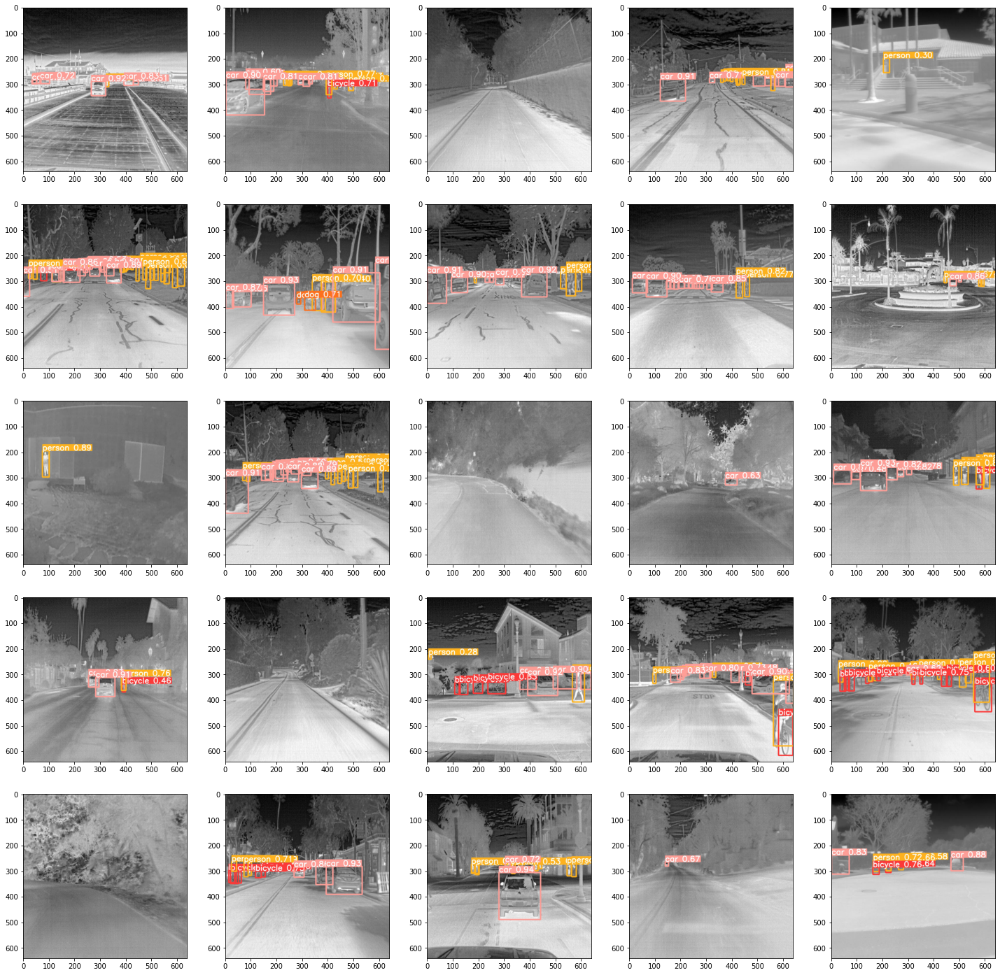

In [14]:
%cd /content/yolov3/runs/detect/{PROJECT_NAME}

from os import listdir
import matplotlib.pyplot as plt
from random import sample

SIZE = 5
_, axarr = plt.subplots(SIZE, SIZE, figsize=(25, 25))

image_files = listdir()

images = iter(sample([plt.imread(image_name) for image_name in image_files], SIZE ** 2))

for r in range(SIZE):
    for c in range(SIZE):
        axarr[r, c].imshow(next(images))

#Video

Try to detect sign language in video

In [12]:
%cd /content/yolov3

!pip install pafy
!pip install youtube_dl==2020.12.2

!python detect.py --weights /content/yolov3/runs/train/{PROJECT_NAME}/weights/last.pt --img 480 720 --conf 0.5 --source {VIDEO_LINK} --name {PROJECT_NAME}

/content/yolov3
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
detect: weights=['/content/yolov3/runs/train/night-vision/weights/last.pt'], source=https://www.youtube.com/watch?v=POtelN1FeZ4, data=data/coco128.yaml, imgsz=[480, 720], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=night-vision, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv3 🚀 v9.6.0-46-gca9a9810 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
Model summary: 190 layers, 61513585 parameters, 0 gradients, 154.6 GFLOPs
WARNING ⚠️ --img-size [480, 720] must be multiple of max s